# Expression of disaggregation genes

In [ ]:
library(ComplexHeatmap)
library(circlize)
library(viridis)
library(proxy)
library(seriation)
library(dendextend)
options(repr.plot.width=38, repr.plot.height=38)
library(dplyr)

In [2]:
#**! Paths where expression data (average expression, expression patterns, expression height), strain order,
#** regulons clusters, and phenotipic data are saved
path_expression='/home/karin/Documents/timeTrajectories/data/regulons/'
path_strain_order='/home/karin/Documents/timeTrajectories/data/'
path_phenotypes = '/home/karin/Documents/timeTrajectories/data/stages/'
path_disag = '/home/karin/Documents/timeTrajectories/data/stages/disagg/'

In [3]:
#**! Specify file names for regulons and expression
#** Expression tab file: Genes in columns (already scaled), averaged strain data in rows, 
#** three additional comlumns: Time, Strain, and Group (meaning strain group)
avg_expression=read.table(paste(path_expression,"genes_averaged_orange_scale99percentileMax0.1.tsv",sep=''),
                          header=TRUE,row.names=1, sep="\t")

#**! Specify file names for phenotipic data
#** Phenotypes tab file: Short averaged sample names in rows (as in avg_expression) and columns with phenotypes.
#** Phenotypes should have values: yes, no, no data
avg_phenotype=read.table(paste(path_phenotypes,"averageStages.tsv",sep=''),
                          header=TRUE,row.names=1, sep="\t", stringsAsFactors=FALSE)
#Change avg_phenotypes data so that each phenotype can be coloured differently
avg_phenotype[avg_phenotype=='no']=NA
for(col in colnames(avg_phenotype)){
  new_col=avg_phenotype[col]
  new_col[new_col=='yes']=col
  avg_phenotype[col]=new_col
}


#** Strain order - single column with ordered strain names
strain_order<-as.vector(read.table(paste(path_strain_order,"strain_order.tsv",sep=''))[,1])

In [4]:
#** Some plotting parameters
legend_font=12
phenotypes_font=10
legened_height=1.5
legend_width=0.7
top_annotation_height=0.6
phenotype_annotation_height=3
cluster_font=20

In [5]:
make_anno<-function(){

#Strain groups annotation
#** Colours of strain groups
group_cols=c('agg-'= '#ed1c24', 'lag_dis'= '#f97402','tag_dis'='#ffb100', 'tag'='#d9d800', 'cud'= '#008629', 'WT'= '#00b2ff',
                        'sFB'= '#1925ae', 'prec'='#a400d4' )
#group_cols_background=c('agg-'= '#cccccc', 'lag_dis'= '#666666','tag_dis'='#666666', 'tag'='#666666', 'cud'= '#cccccc', 
#                        'WT'= '#cccccc','sFB'= '#cccccc', 'prec'='#cccccc' )
group_cols_background=c('agg-'= 'white', 'lag_dis'= 'white','tag_dis'='#666666', 'tag'='#666666', 'cud'= 'white', 
                        'WT'= 'white','sFB'= 'white', 'prec'='white' )
group_cols_text=c('agg-'= 'black', 'lag_dis'= 'black','tag_dis'='black', 'tag'='black', 'cud'= '#eeeeee', 
                        'WT'= 'black','sFB'= '#eeeeee', 'prec'='#eeeeee' )

group_data=t(avg_expression['Group'])
rownames(group_data)<-c('Phenotypic group')            
# ht_list=Heatmap(group_data,show_column_names = FALSE, 
#                 height = unit(top_annotation_height, "cm"),
#                 column_split=factor(avg_expression$Strain,
#                                     #** Ordering of the strains in the heatmap (a vector of strain names)
#                                     #levels=unique(avg_expression$Strain)
#                                     levels=strain_order
#                 ),
#                 cluster_columns=FALSE,name='\nPhenotypic \ngroup\n',
#                 #** Strain name font size
#                 column_title_gp=gpar(fontsize=legend_font),
#                 col=group_cols, heatmap_legend_param = list( 
#                 grid_width= unit(legend_width, "cm"),grid_height= unit(legened_height, "cm") ,
#                 labels_gp = gpar(fontsize = cluster_font),title_gp = gpar(fontsize = cluster_font)),
#                 row_names_gp = gpar(fontsize = cluster_font))

#Time annotation
times=unique(avg_expression$Time)
#** Time colours, group colours, and gaps
group_cols_ordered=c()
groups_ordered=c()
background_cols_ordered=c()
text_cols_ordered=c()
gaps=c()
previous_group=NULL
for(strain in strain_order){
  group=as.character(avg_expression[avg_expression$Strain==strain,'Group'][1])
  #print(paste(strain,group,group_cols[group]))
  groups_ordered<-append(groups_ordered,group)
  group_cols_ordered<-append(group_cols_ordered,group_cols[group])
  background_cols_ordered<-append(background_cols_ordered,group_cols_background[group])
  text_cols_ordered<-append(text_cols_ordered,group_cols_text[group])
  #Gaps - if previous group was different add larger gap; (N gaps = N-1 columns)
  if (!is.null(previous_group)){
    if (previous_group==group){ 
      gaps=append(gaps,1)
    }else{
      gaps=append(gaps,2.5)
    }
  }
  previous_group=group
}
gaps=unit(gaps,'mm')

col_time = colorRamp2( c(min(times),max(times)),c( "white", "#440154FF"))

ht_list=Heatmap(t(avg_expression['Time']), height = unit(top_annotation_height, "cm"),
                column_split=factor(avg_expression$Strain,
                #** Ordering of the strains in the heatmap (a vector of strain names)
                levels=strain_order ),
                column_title =NULL,column_gap=gaps,
                cluster_columns=FALSE, show_column_names = FALSE,name='\nTime\n',col=col_time,
                heatmap_legend_param = 
                list( at = c(min(times),as.integer(mean(c(min(times),max(times)))),max(times)),
                grid_width= unit(legend_width, "cm"),grid_height= unit(legened_height, "cm") ,
                labels_gp = gpar(fontsize = cluster_font),title_gp = gpar(fontsize = cluster_font)
                    ),
                row_names_gp = gpar(fontsize = cluster_font),
                #column_title_gp=gpar(border =group_cols_ordered,fontsize=cluster_font,col =text_cols_ordered,fill=group_cols_ordered,
                #                     fontface='bold'),
                #Annotation for Phenotype group
                top_annotation = HeatmapAnnotation(
                  Phenotype=anno_block(gp = 
                                         # Background colour; fill: color, col: border                               
                                         #gpar(fill = '#949494',col='transparent'),
                                         #gpar(fill = 'white',col='transparent'),
                                         #gpar(fill = background_cols_ordered,col='transparent'),
                                         #gpar(fill = group_cols_ordered,col=group_cols_ordered),
                                         gpar(fill=group_cols_ordered,col=group_cols_ordered,lwd =2,linejoin='mitre'),
                                       labels = groups_ordered , labels_gp = gpar(col = 
                                                                                    # Text colour
                                                                                    # 'black',
                                                                                    #group_cols_ordered, 
                                                                                    text_cols_ordered,
                                                                                  fontsize = cluster_font
                                                                                  #,fontface='bold'
                                       ),
                                       #show_name = TRUE
                                      ) ,
                  Strain = anno_block(gp = 
                                            # Background colour; fill: color, col: border                               
                                            #gpar(fill = '#949494',col='transparent'),
                                            #gpar(fill = 'white',col='transparent'),
                                            #gpar(fill = background_cols_ordered,col='transparent'),
                                            #gpar(fill = group_cols_ordered,col=group_cols_ordered),
                                              gpar(fill='white',col=group_cols_ordered,lwd =2,linejoin='mitre'),
                        labels = strain_order , labels_gp = gpar(col = 
                                                                    # Text colour
                                                                   'black',
                                                                    #group_cols_ordered, 
                                                                    #text_cols_ordered,
                                                                    fontsize = cluster_font
                                                                  #,fontface='bold'
                                                                  ), 
                                      #show_name = TRUE
                                     ),
                annotation_name_gp=gpar(fontsize = cluster_font)
                        )
                )
#ht_list=ht_list %v% ht_time

#Phenotype annotation
#** Colours of phenotype annotations
phenotype_cols=c('no image'= '#d9d9d9', 'no_agg'= '#ed1c24', 'stream'= '#985006', 'lag'= '#f97402', 'tag'= '#d9d800', 'tip'= '#66cf00',
  'slug'= '#008629', 'mhat'= '#00c58f', 'cul'= '#0ff2ff', 'FB'= '#00b2ff', 'yem'='#666666')
#phenotype_cols=c('no data'= '#d9d9d9', 'yes'= '#74cf19', 'no'='#b54c4c')
ht_phenotype=Heatmap(t(avg_phenotype)[,rownames(avg_expression)], height = unit(phenotype_annotation_height, "cm"),
                cluster_columns=FALSE,cluster_rows=FALSE, show_column_names = FALSE,name='\nMorphological \nstage\n',col=phenotype_cols,
                row_names_gp = gpar(fontsize = phenotypes_font), na_col = "white",
                row_title ='Morphological stage',row_title_side ='right',row_title_gp=gpar(fontsize = cluster_font),
                heatmap_legend_param = list( grid_width= unit(legend_width, "cm"),grid_height= unit(legened_height, "cm") ,
                                             labels_gp = gpar(fontsize = cluster_font),title_gp = gpar(fontsize = cluster_font)))
ht_list=ht_list %v% ht_phenotype
    
return(ht_list)
}

In [6]:
stage_order<-colnames(avg_phenotype)
expressions<-within(avg_expression, rm('Time', 'Strain','Group'))
min_expression<-min(expressions)
max_expression<-max(expressions)

## Gene selection based on comparison of peaks and valleys in PC1
PC1 of tgrB1 and tgrB1C1 show a peak followed by a valley. Expression at the first peak (6/8h, reference) was compared to expression in the valley (14h, case). Genes DE between these two timepoints were selected at different thresholds of DESeq2 results.

In [7]:
params_data<-data.frame(padj_max=c(0.01,0.05),lfc_min=c(2,1))

`use_raster` is automatically set to TRUE for a matrix with more than
2000 rows. You can control `use_raster` arugment by explicitly setting
TRUE/FALSE to it. Set `ht_opt$message = FALSE` to turn off this
message.



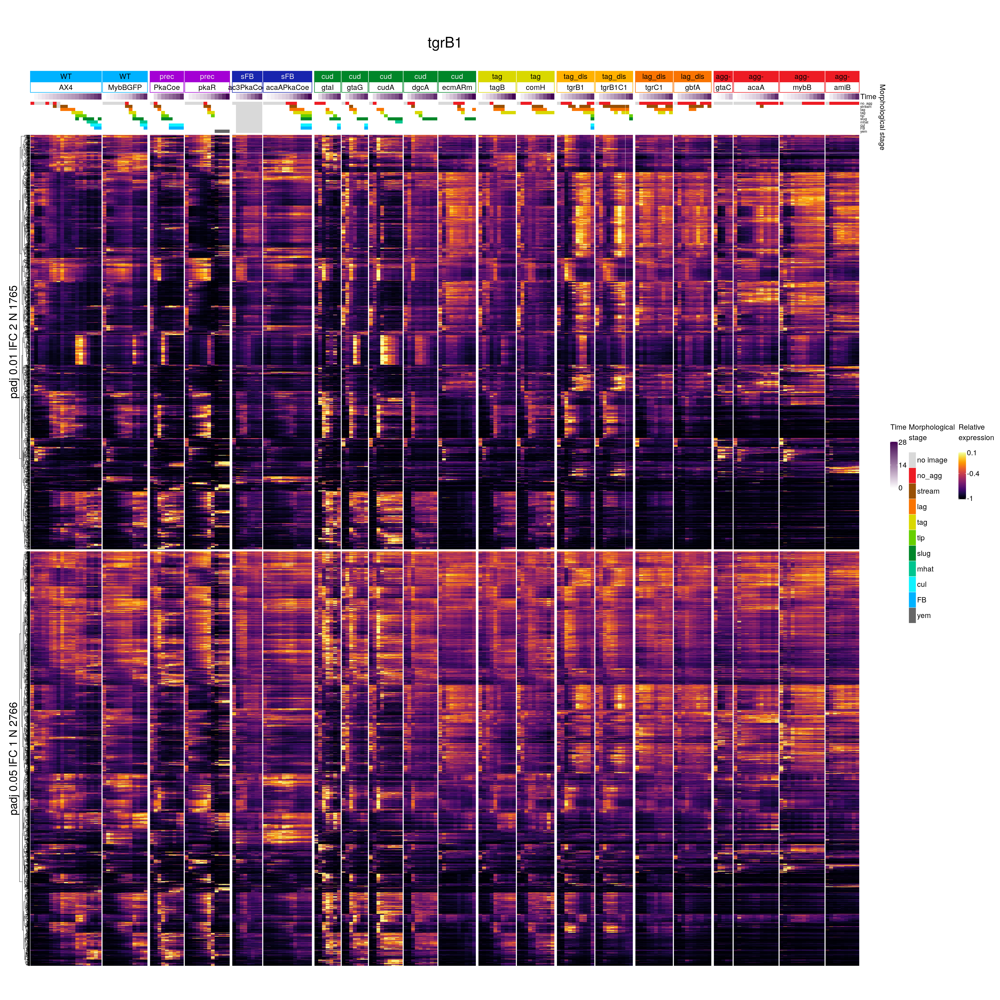

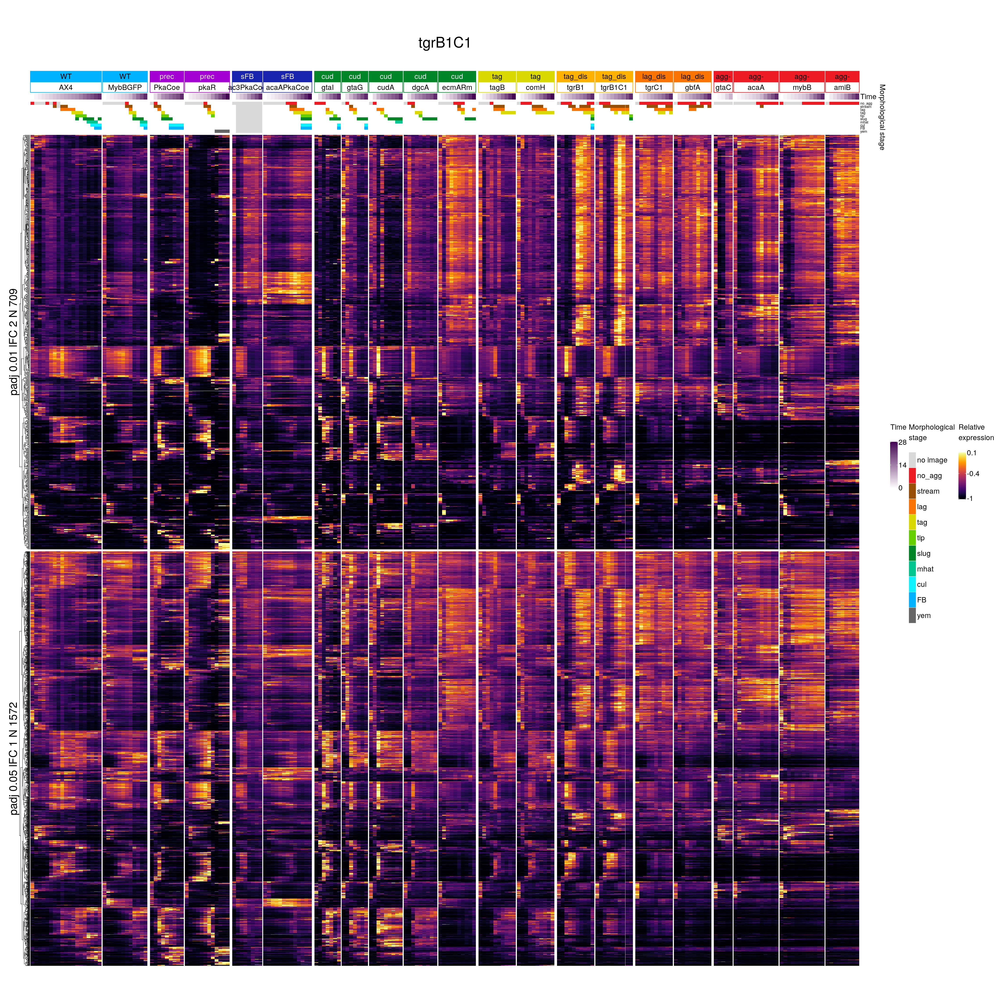

In [10]:
for (strain in c('tgrB1','tgrB1C1')){
    data=read.table(paste(path_disag,'deSeq/PCA',strain,'_DE_dis_ref_agg_padj_lFC.tsv',sep=''),
                    header=TRUE,sep='\t',row.names=1)
    first=TRUE
    heatmaps=make_anno()
    for(param_idx in 1:nrow(params_data)){
        padj=params_data[param_idx,'padj_max'] 
        lfc=params_data[param_idx,'lfc_min']
        genes<-rownames(data[abs(data$log2FoldChange)>=lfc & data$padj<=padj,])
        genes_previous=c()
        if (param_idx>1) genes_previous=rownames(data[data$log2FoldChange>=params_data[param_idx-1,'lfc_min'] 
             & data$padj<=params_data[param_idx-1,'padj_max'] ,])
        genes<-genes[which(!genes %in% genes_previous)]
        n_genes=length(genes)
        #print(paste(padj,lfc,n_genes))
        
        data_anno=paste('padj',padj,'lFC',lfc,'N',n_genes)
        height=0.5*n_genes
        if (height>40) height=40
        heatmap=Heatmap(t(avg_expression[,genes]),cluster_columns = FALSE,cluster_rows = TRUE,
                        show_column_names = FALSE,
                          show_row_names = FALSE, col=inferno(256),column_title=NULL, 
                          row_title=data_anno,
                          show_heatmap_legend = first,heatmap_legend_param = list(
                          title = "\nRelative \nexpression\n",
                          at = c(min_expression, round(mean(c(min_expression,max_expression)),1),max_expression),
                          grid_width= unit(legend_width, "cm"),grid_height= unit(legened_height, "cm") ,
                          labels_gp = gpar(fontsize = cluster_font),title_gp = gpar(fontsize = cluster_font)),
                          #** Cluster name fontsize
                          row_title_gp=gpar(fontsize=cluster_font*1.5),height=unit(height, "cm"))
        first=FALSE
        heatmaps = heatmaps %v% heatmap
    }
    draw(heatmaps,width=unit(80, "cm"),
     column_title =paste(strain,'\n'),column_title_gp = gpar(fontsize = cluster_font*2),ht_opt$message = FALSE)
}

## Genes with more complex expression profile in disagg strain than in AX4
For each disagg strain genes that have more complex expression profile than in AX4 were extracted.

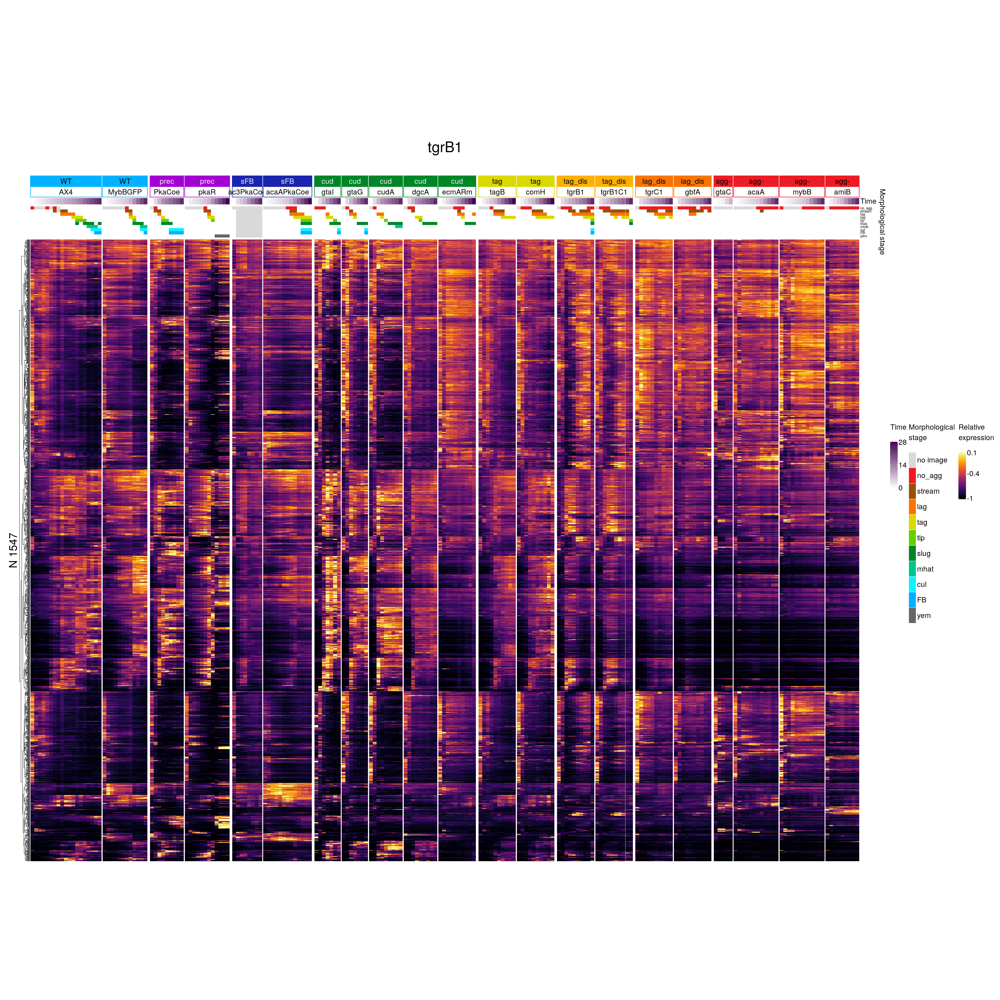

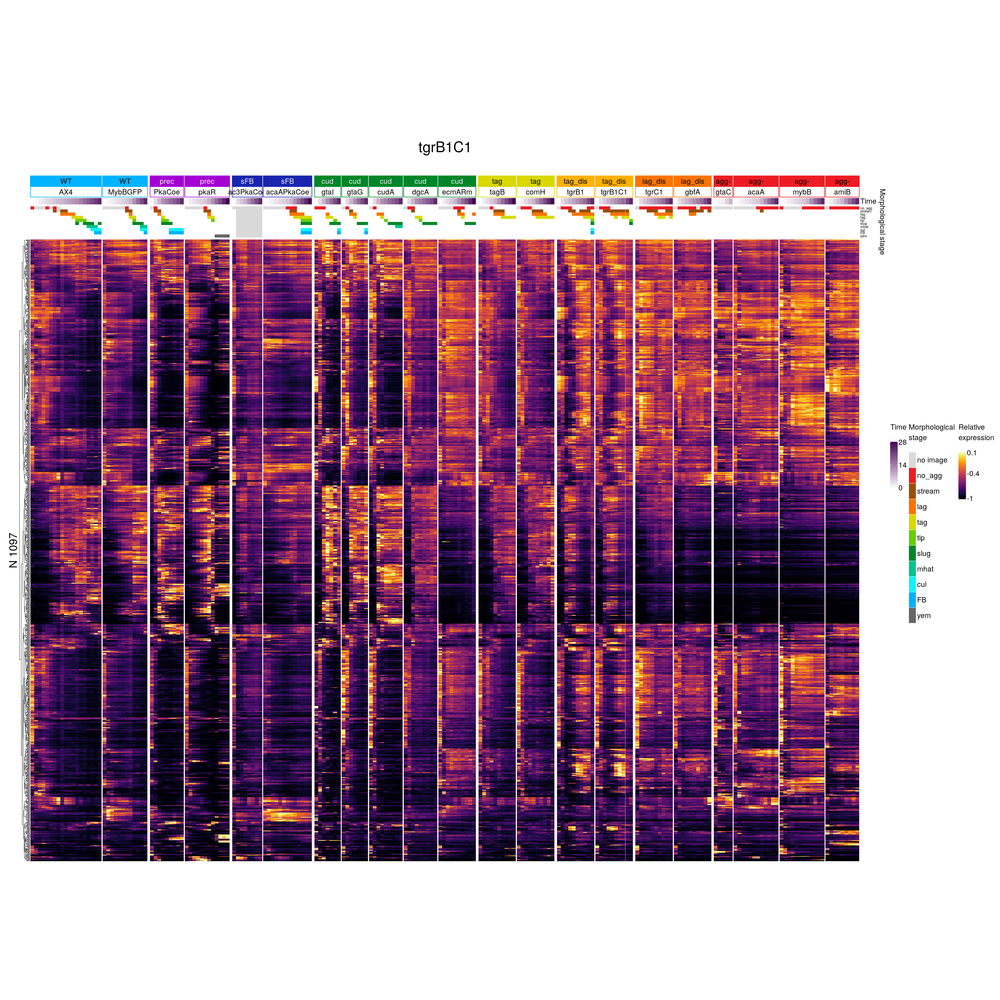

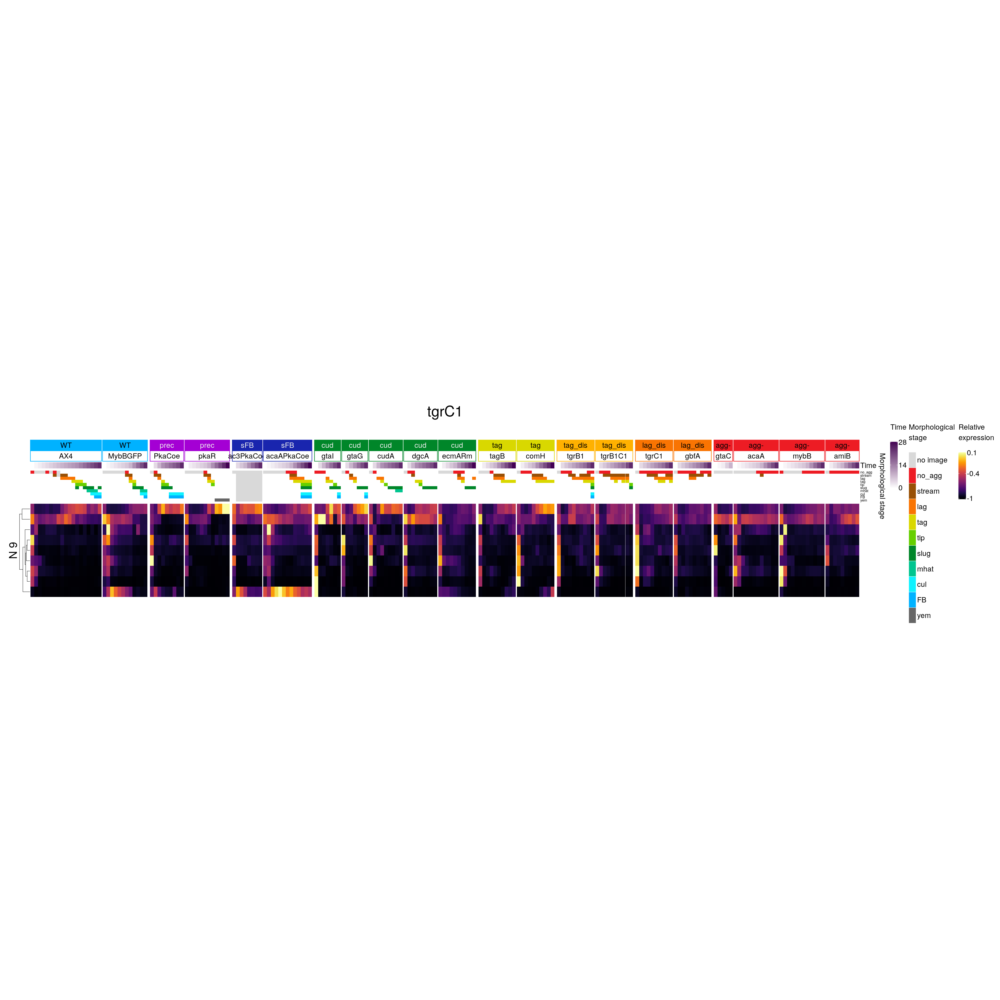

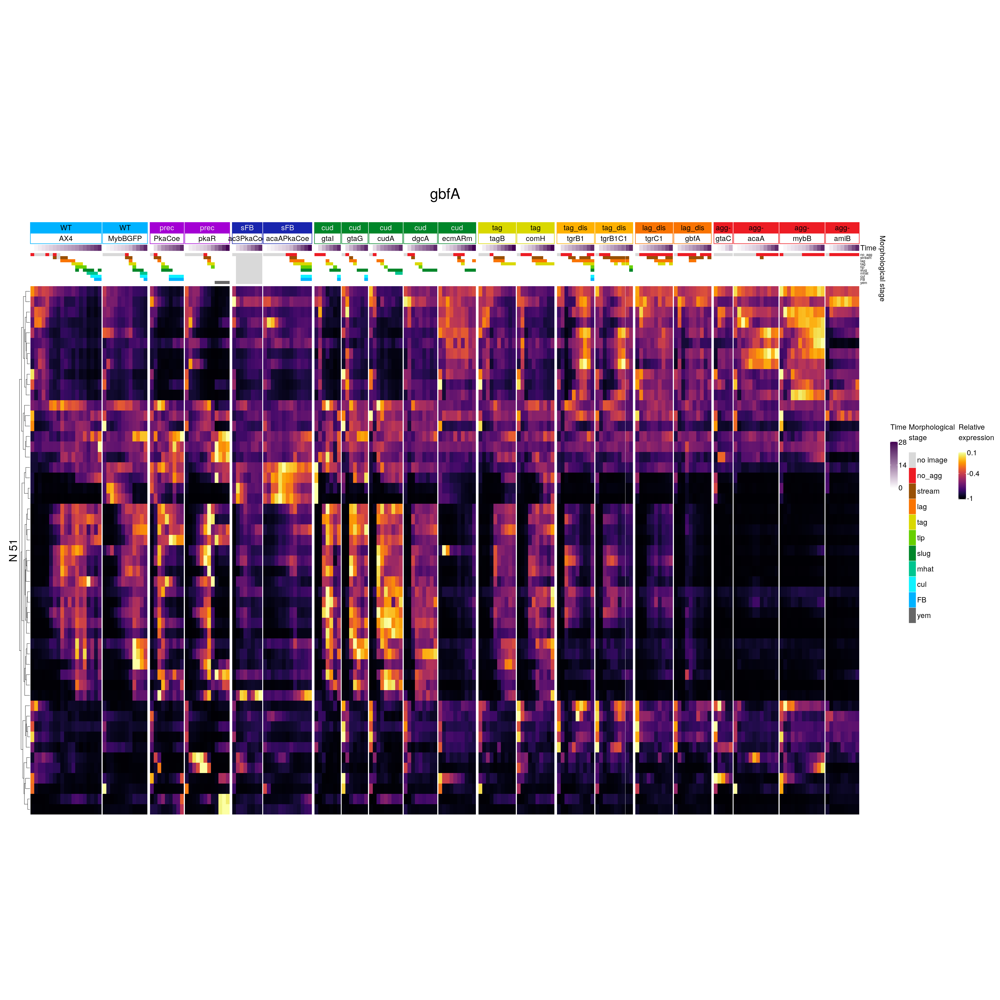

In [21]:
for (strain in c('tgrB1','tgrB1C1','tgrC1','gbfA')){
    data=read.table(paste(path_disag,'impulse/filtered/filteredGenes_diffT0.1_',strain,'.tsv',sep=''),
                    header=TRUE,sep='\t')
    genes<-as.vector(data$Gene)
    n_genes=length(genes)

    data_anno=paste('N',n_genes)
    height=1*n_genes
    if (height>60) height=60
    heatmap=Heatmap(t(avg_expression[,genes]),cluster_columns = FALSE,cluster_rows = TRUE,
                    show_column_names = FALSE,
                      show_row_names = FALSE, col=inferno(256),column_title=NULL, 
                      row_title=data_anno,
                      show_heatmap_legend = TRUE,heatmap_legend_param = list(
                      title = "\nRelative \nexpression\n",
                      at = c(min_expression, round(mean(c(min_expression,max_expression)),1),max_expression),
                      grid_width= unit(legend_width, "cm"),grid_height= unit(legened_height, "cm") ,
                      labels_gp = gpar(fontsize = cluster_font),title_gp = gpar(fontsize = cluster_font)),
                      #** Cluster name fontsize
                      row_title_gp=gpar(fontsize=cluster_font*1.5),height=unit(height, "cm"))

    draw(make_anno() %v% heatmap,width=unit(80, "cm"),
        column_title =paste(strain,'\n'),column_title_gp = gpar(fontsize = cluster_font*2))

}

## Conclusion
The two methods are able to extract both overlapping and unique genes. This indicates that neither of the two methods is able to extract all genes possibly involved in disagg behaviour. 